In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

# Matlab Haldane

In [ ]:
def runge_kutta_step(psi, dt, n, m, c, cNN_mag, phi, M1, M2, chunk, g, nonlinear_sites):
    def H_total(psi):
        return haldane_zigzag(n, m, c, cNN_mag, phi, M1, M2, chunk, psi=psi, g=g, nonlinear_sites=nonlinear_sites)

    k1 = -1j * H_total(psi) @ psi
    k2 = -1j * H_total(psi + 0.5 * dt * k1) @ (psi + 0.5 * dt * k1)
    k3 = -1j * H_total(psi + 0.5 * dt * k2) @ (psi + 0.5 * dt * k2)
    k4 = -1j * H_total(psi + dt * k3) @ (psi + dt * k3)

    return psi + (dt / 6) * (k1 + 2 * k2 + 2 * k3 + k4)


In [ ]:
def generate_zigzag_coords(n, m):
    """
    Returns X, Y coordinate arrays for zigzag nanoribbon sites (interleaved A and B).
    A-sites at even indices, B-sites at odd indices.
    """
    # Lattice vectors
    a1 = np.array([1.5,  np.sqrt(3)/2])
    a2 = np.array([1.5, -np.sqrt(3)/2])
    delta = np.array([[0, 0], [1, 0]])  # A and B sublattice offsets

    # Generate grid of unit cells
    IX, IY = np.meshgrid(np.arange(n), np.arange(m))
    IX = IX.flatten()
    IY = IY.flatten()
    N_uc = len(IX)
    N = 2 * N_uc

    # Allocate coordinate arrays
    X = np.zeros(N)
    Y = np.zeros(N)

    # A sublattice positions
    A_x = IX * a1[0] + IY * a2[0] + delta[0, 0]
    A_y = IX * a1[1] + IY * a2[1] + delta[0, 1]

    # B sublattice positions
    B_x = IX * a1[0] + IY * a2[0] + delta[1, 0]
    B_y = IX * a1[1] + IY * a2[1] + delta[1, 1]

    # Interleave A and B into single arrays
    X[0::2] = A_x
    Y[0::2] = A_y
    X[1::2] = B_x
    Y[1::2] = B_y

    return X, Y

#--------------------------------------------------#

def haldane_zigzag(n, m, c, cNN_mag, phi, M1, M2, chunk, psi=None, g=0.0, nonlinear_sites=None):
    """
    Generate the Haldane tight-binding Hamiltonian on a zigzag nanoribbon,
    with optional Kerr nonlinearity from psi if provided.
    """
    N = 2 * n * m
    H = np.zeros((N, N), dtype=complex)
    cNN = cNN_mag * np.exp(1j * phi)

    def index(ix, iy, s):
        """Map (ix, iy, sublattice) to global site index"""
        return 2 * (iy * n + ix) + s

    for ix in range(n):
        for iy in range(m):
            a = index(ix, iy, 0)  # A site
            b = index(ix, iy, 1)  # B site

            # On-site mass terms
            H[a, a] = M1 / 2
            H[b, b] = -M1 / 2

            if (n//2 - chunk <= ix <= n//2 + chunk) and (m//2 - chunk <= iy <= m//2 + chunk) and g==0:
                H[a, a] = M2 / 2
                H[b, b] = -M2 / 2
            if (n//2 - chunk <= ix <= n//2 + chunk) and (m//2 - chunk <= iy <= m//2 + chunk) and g!=0:
                H[a, a] = g * np.abs(psi[a])**2
                H[b, b] = -g * np.abs(psi[b])**2

            # Nearest-neighbor hopping (A-B)
            if ix + 1 < n:
                a1 = index(ix + 1, iy, 0)
                H[b, a1] = -c
            if iy + 1 < m:
                a2 = index(ix, iy + 1, 0)
                H[b, a2] = -c
            H[a, b] = -c

            # Next-nearest-neighbor hopping (A-A and B-B)
            a_nn_offsets = [(1, 0), (-1, 1), (0, -1)]
            for dx, dy in a_nn_offsets:
                ni, nj = ix + dx, iy + dy
                if 0 <= ni < n and 0 <= nj < m:
                    a2 = index(ni, nj, 0)
                    H[a, a2] = -cNN

            b_nn_offsets = [(-1, 0), (1, -1), (0, 1)]
            for dx, dy in b_nn_offsets:
                ni, nj = ix + dx, iy + dy
                if 0 <= ni < n and 0 <= nj < m:
                    b2 = index(ni, nj, 1)
                    H[b, b2] = -cNN

    # Hermitian symmetrization
    H = H + H.conj().T

    # # Add Kerr nonlinearity if psi and nonlinear_sites are provided
    # if psi is not None and nonlinear_sites is not None:
    #     for site in nonlinear_sites:
    #       if site in nonlinear_sites_A:
    #         H[site, site] = -10 #g * np.abs(psi[site])**2
    #       elif site in nonlinear_sites_B:
    #         H[site, site] = 10 #g * np.abs(psi[site])**2

    return H


In [ ]:
# Parameters
n, m = 20, 20        # lattice dimensions
c = 1.0              # NN hopping
cNN_mag = 0.1 * c    # NNN hopping magnitude
phi =  np.pi / 2      # NNN hopping phase
M1 = 0.1               # bulk mass
M2 = 0.1               # perturbed region mass
chunk = 5            # perturbation chunk size
g = 0  # Kerr strength
# Create Hamiltonian
H = haldane_zigzag(n, m, c, cNN_mag, phi, M1, M2, chunk)

N = 2 * n * m
psi = np.zeros(N, dtype=complex)

# For example, initialize with a localized state on a few B-sites
# B-site index = 2*(iy * n + ix) + 1
ix, iy = 10, 5

# psi[139] = np.sqrt(10/6)*np.exp(-1j*np.pi/6) #1
# psi[140] = np.sqrt(10/6)*np.exp(-2j*np.pi/6) #2
# psi[141] = np.sqrt(10/6)*np.exp(-3j*np.pi/6) #3
# psi[178] = np.sqrt(10/6)*np.exp(-4j*np.pi/6) #4
# psi[179] = np.sqrt(10/6)*np.exp(-5j*np.pi/6) #5
# psi[180] = np.sqrt(10/6)*np.exp(-6j*np.pi/6) #6

psi[20] = 1
psi[22] = -1
psi[24] = 1
psi[26] = -1
psi[28] = 1

# psi[175] = -1
# psi[177] = 1
# psi[179] = -1
# psi[181] = 1
# psi[183] = -1

# psi[214] = -1
# psi[216] = 1
# psi[218] = -1
# psi[220] = 1
# psi[222] = -1

#........................#

nonlinear_sites = [139, 140, 141, 180, 179, 178]  # Your six sites
nonlinear_sites_A = [139, 141, 179]
nonlinear_sites_B = [140, 178, 180]
timesteps = 10000 # maybe run more steps for a smooth plot
dt = 0.01

evolution = []
site_intensities = {site: [] for site in nonlinear_sites}

# for _ in range(timesteps):
#     psi = runge_kutta_step(psi, dt, n, m, c, cNN_mag, phi, M1, M2, chunk, g, nonlinear_sites)
#     evolution.append(np.abs(psi)**2)



In [ ]:
#........................
X, Y = generate_zigzag_coords(n, m)
plt.rcParams['animation.embed_limit'] = 500  # Sets the limit to 50 MB


def update(frame):
    prob_density = evolution[frame]
    scat.set_array(prob_density)
    ax.set_title(f"Time Step: {frame}", fontsize=20)
    return scat,

from mpl_toolkits.axes_grid1 import make_axes_locatable

from matplotlib.animation import FuncAnimation

fig, ax = plt.subplots(figsize=(10, 10))

# --- set desired color scale limits here ---
vmin = 0.0            # minimum color scale (optional)
vmax = 0.05           # << change this number to your preferred upper limit

scat = ax.scatter(X, Y, c=[], cmap='viridis', s=90,
                  vmin=vmin, vmax=vmax)  # <-- added vmin/vmax

# Create a divider and append a smaller colorbar axis
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="3%", pad=0.1)

cbar = plt.colorbar(scat, cax=cax)
cbar.set_label('Probability Density', fontsize=16)
cbar.ax.tick_params(labelsize=14)

ax.set_xlabel("x (a.u.)", fontsize=18)
ax.set_ylabel("y (a.u.)", fontsize=18)
ax.tick_params(axis='both', labelsize=16)
ax.set_aspect('equal', adjustable='box')

def update(frame):
    prob_density = evolution[frame]
    scat.set_array(prob_density)
    ax.set_title(f"Time Step: {frame}", fontsize=20)
    return scat,

ani = FuncAnimation(fig, update, frames=range(0, timesteps, 100), blit=True)
plt.close(fig)

from IPython.display import HTML
HTML(ani.to_jshtml())


/tmp/ipython-input-396901222.py:10: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'vmin', 'vmax' will be ignored
  scat = ax.scatter(X, Y, c=[], cmap='viridis', s=90,


In [ ]:
import numpy as np
from matplotlib.animation import FuncAnimation
from mpl_toolkits.axes_grid1 import make_axes_locatable

# --- your existing bits ---
X, Y = generate_zigzag_coords(n, m)          # shape: (N,)
plt.rcParams['animation.embed_limit'] = 500  # MB
N = len(X)

# --- figure & main scatter ---
fig, ax = plt.subplots(figsize=(10, 10))
scat = ax.scatter(X, Y, c=np.zeros(N), cmap='viridis', s=90)

# colorbar
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="3%", pad=0.1)
cbar = plt.colorbar(scat, cax=cax)
cbar.set_label('Probability Density', fontsize=16)
cbar.ax.tick_params(labelsize=14)

ax.set_xlabel("x (a.u.)", fontsize=18)
ax.set_ylabel("y (a.u.)", fontsize=18)
ax.tick_params(axis='both', labelsize=16)
ax.set_aspect('equal', adjustable='box')

# overlay to highlight the top-5 selected sites (red rings)
highlight = ax.scatter([], [], s=250, facecolors='none', edgecolors='red', linewidths=2)

# in-axes text readout
readout = ax.text(
    0.02, 0.98, "", transform=ax.transAxes, va='top', ha='left', fontsize=16,
    bbox=dict(boxstyle='round', fc='white', alpha=0.6)
)

# --- add a small timeline axis under the main plot to accumulate the Top-5 sum ---
ax_sum = divider.append_axes("bottom", size="18%", pad=0.6, sharex=None)
ax_sum.set_xlabel("Frame", fontsize=12)
ax_sum.set_ylabel("Top-5 sum", fontsize=12)
ax_sum.tick_params(axis='both', labelsize=10)
line_sum, = ax_sum.plot([], [], lw=2)
ax_sum.grid(True, alpha=0.3)

frames_to_show = range(0, timesteps, 100)   # same as your animation frames
sum_history = []
frame_history = []

def update(frame):
    prob_density = evolution[frame]  # shape: (N,)
    scat.set_array(prob_density)

    # ---- find highest 5 sites anywhere (fast + stable) ----
    # argpartition finds indices of the 5 largest without full sort
    k = 5
    idx_top = np.argpartition(prob_density, -k)[-k:]
    # order them descending for consistency (optional)
    idx_top = idx_top[np.argsort(prob_density[idx_top])[::-1]]

    top5_sum = float(prob_density[idx_top].sum())

    # update highlight overlay
    highlight.set_offsets(np.c_[X[idx_top], Y[idx_top]])

    # update text readout
    readout.set_text(
        f"Time Step: {frame}\n"
        f"Top-5 sum = {top5_sum:.6f}"
    )

    # update running timeline
    frame_history.append(frame)
    sum_history.append(top5_sum)
    line_sum.set_data(frame_history, sum_history)
    if len(frame_history) > 1:
        ax_sum.set_xlim(min(frame_history), max(frame_history))
        ymin, ymax = min(sum_history), max(sum_history)
        pad = 0.05*(ymax - ymin + 1e-12)
        ax_sum.set_ylim(ymin - pad, ymax + pad)

    return scat, highlight, readout, line_sum

ani = FuncAnimation(fig, update, frames=frames_to_show, blit=False)
plt.close(fig)

from IPython.display import HTML
HTML(ani.to_jshtml())


/tmp/ipython-input-2134733193.py:74: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  ax_sum.set_xlim(min(frame_history), max(frame_history))


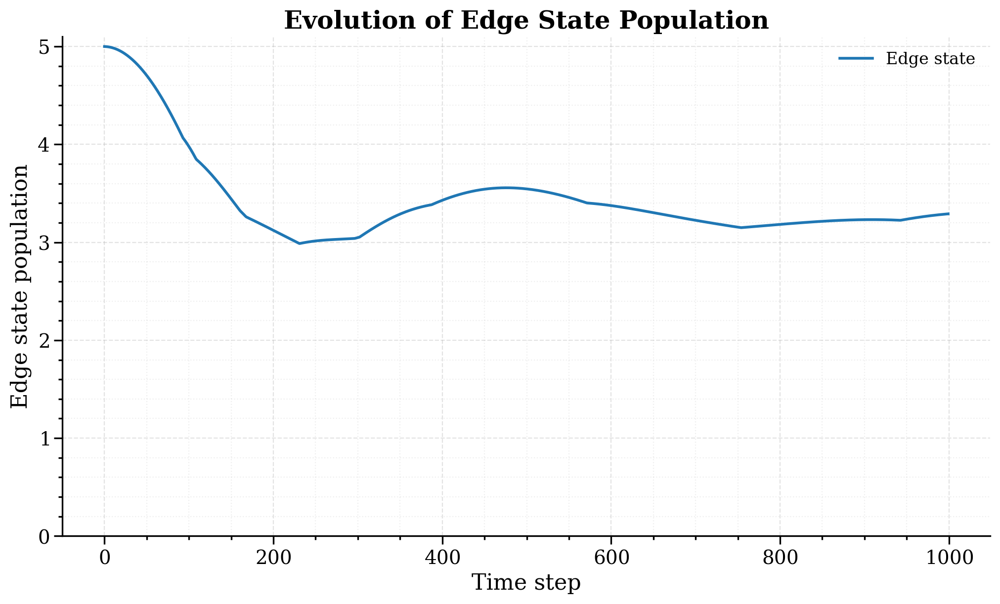

In [ ]:
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.ticker import AutoMinorLocator, ScalarFormatter

# ---------- Recommended global style ----------
mpl.rcParams.update({
    "figure.dpi": 200,
    "savefig.dpi": 300,
    "font.size": 12,
    "font.family": "serif",          # or "sans-serif" if your thesis requires it
    "axes.titleweight": "bold",
    "axes.labelsize": 16,
    "axes.titlesize": 18,
    "xtick.labelsize": 14,
    "ytick.labelsize": 14,
    "axes.linewidth": 1.2,
})

# ---------- Compute top-15 sums ----------
top15_sums = []
for frame in range(timesteps):
    prob_density = evolution[frame]  # shape (N,)
    top15 = np.sort(prob_density)[-10:]
    top15_sums.append(top15.sum())
top15_sums = np.array(top15_sums)

# ---------- Plot ----------
fig, ax = plt.subplots(figsize=(10, 6), constrained_layout=True)

x = np.arange(timesteps)
ax.plot(x, top15_sums, lw=2, label="Edge state")

ax.set_xlabel("Time step")
ax.set_ylabel("Edge state population")
ax.set_title("Evolution of Edge State Population")

# axis limits (keep your range if needed)
ax.set_ylim(0, 5.1)


# minor ticks
# Minor ticks + grid
ax.xaxis.set_minor_locator(AutoMinorLocator())
ax.yaxis.set_minor_locator(AutoMinorLocator())
ax.grid(which="major", linestyle="--", alpha=0.35)
ax.grid(which="minor", linestyle=":", alpha=0.2)

# Cleaner spines & thicker ticks
for spine in ("top", "right"):
    ax.spines[spine].set_visible(False)
ax.tick_params(axis="both", which="both", width=1.2)
ax.tick_params(axis="both", which="major", length=6)
ax.tick_params(axis="both", which="minor", length=3)

# Nice numeric formatting
ax.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
ax.xaxis.set_major_formatter(ScalarFormatter(useMathText=True))

# Legend
ax.legend(frameon=False, fontsize=12)

# Export high-quality figure
plt.savefig("edge_state_homo.pdf", bbox_inches="tight")   # vector (preferred for thesis)
plt.savefig("edge_state_homo.png", bbox_inches="tight")   # high-res raster
plt.show()


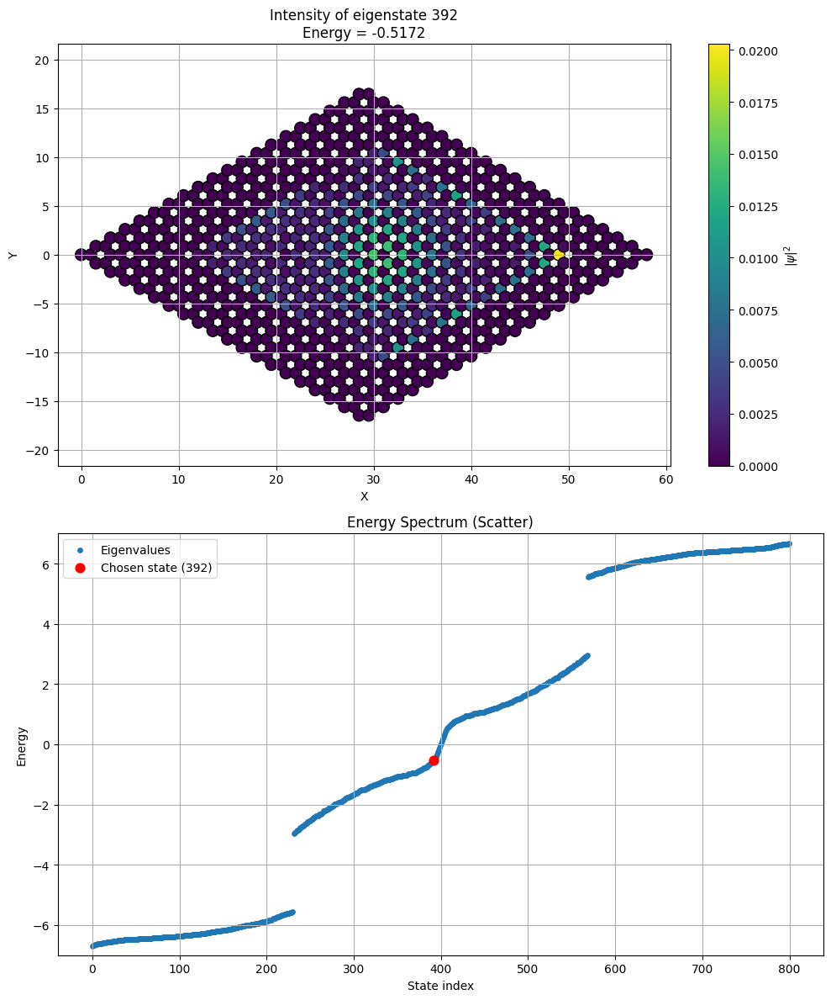

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Your provided functions:
# - generate_zigzag_coords
# - haldane_zigzag

# Parameters
n = 20   # number of unit cells along x
m = 20   # number of unit cells along y
c = 1.0  # nearest-neighbor hopping strength
cNN_mag = 0.1  # next-nearest-neighbor hopping strength magnitude
phi = np.pi/2  # phase for NNN hopping
M1 = 6       # mass term outside the chunk
M2 = 0.1         # mass term inside the chunk
chunk = 6      # defines the "chunk" size with modified mass
g = 0.0        # Kerr nonlinearity strength (set to 0 for now)

# Step 1: Generate Hamiltonian
H = haldane_zigzag(n, m, c, cNN_mag, phi, M1, M2, chunk)
H2 = haldane_zigzag(n, m, c, cNN_mag, phi, M1, M1, chunk)

# Step 2: Diagonalize Hamiltonian
eigenvalues, eigenvectors = np.linalg.eigh(H)
eigenvalues2, eigenvectors2 = np.linalg.eigh(H2)

# Step 3: Generate real space coordinates
X, Y = generate_zigzag_coords(n, m)

# Step 4: Choose an eigenvector to plot
index_to_plot = 392  # middle eigenstate (can change)
psi = eigenvectors[:, index_to_plot]
psi2 = eigenvectors2[:, index_to_plot]

# Step 5: Prepare intensity data
intensity = np.abs(psi)**2
intensity2 = np.abs(psi2)**2

# Step 6: Plotting
fig, axs = plt.subplots(2, 1, figsize=(10, 12))

# (a) Plot 1: Real space intensity map
sc = axs[0].scatter(X, Y, c=intensity, cmap='viridis', s=100, edgecolors='k')
plt.colorbar(sc, ax=axs[0], label=r'$|\psi|^2$')
axs[0].set_title(f'Intensity of eigenstate {index_to_plot}\nEnergy = {eigenvalues[index_to_plot]:.4f}')
axs[0].set_xlabel('X')
axs[0].set_ylabel('Y')
axs[0].axis('equal')
axs[0].grid(True)

# (b) Plot 2: Energy spectrum
axs[1].scatter(np.arange(len(eigenvalues)), eigenvalues, s=15, label='Eigenvalues')
axs[1].scatter(index_to_plot, eigenvalues[index_to_plot], c='red', s=60, label=f'Chosen state ({index_to_plot})')
axs[1].set_xlabel('State index')
axs[1].set_ylabel('Energy')
axs[1].set_title('Energy Spectrum (Scatter)')
axs[1].legend()
plt.ylim([-7,7])
axs[1].grid(True)

plt.tight_layout()
plt.show()

# # Plot both energy spectra in one plot
# plt.figure(figsize=(15, 10))

# # Plot eigenvalues of H (with chunk)
# plt.scatter(np.arange(len(eigenvalues)), eigenvalues, s=15, label='With C_Chunk =1', alpha=0.7)

# # Plot eigenvalues of H2 (uniform)
# plt.scatter(np.arange(len(eigenvalues2)), eigenvalues2, s=15, label='Uniform ', alpha=0.7)

# # Highlight the chosen state
# plt.scatter(index_to_plot, eigenvalues[index_to_plot], c='red', s=60, label=f'Chosen state H[{index_to_plot}]')
# plt.scatter(index_to_plot, eigenvalues2[index_to_plot], c='green', s=60, label=f'Chosen state H2[{index_to_plot}]')

# Axis labels and settings
# plt.xlabel('State index')
# plt.ylabel('Energy')
# plt.title('Energy Spectrum Comparison: With Chunk vs Uniform')
# plt.ylim([-7, 7])
# plt.grid(True)
# plt.legend()
# plt.tight_layout()
# plt.show()




<>:34: SyntaxWarning: invalid escape sequence '\D'
<>:34: SyntaxWarning: invalid escape sequence '\D'
/tmp/ipython-input-1565727096.py:34: SyntaxWarning: invalid escape sequence '\D'
  plt.title('Energy Spectra for Different $\Delta M$', fontsize=24)


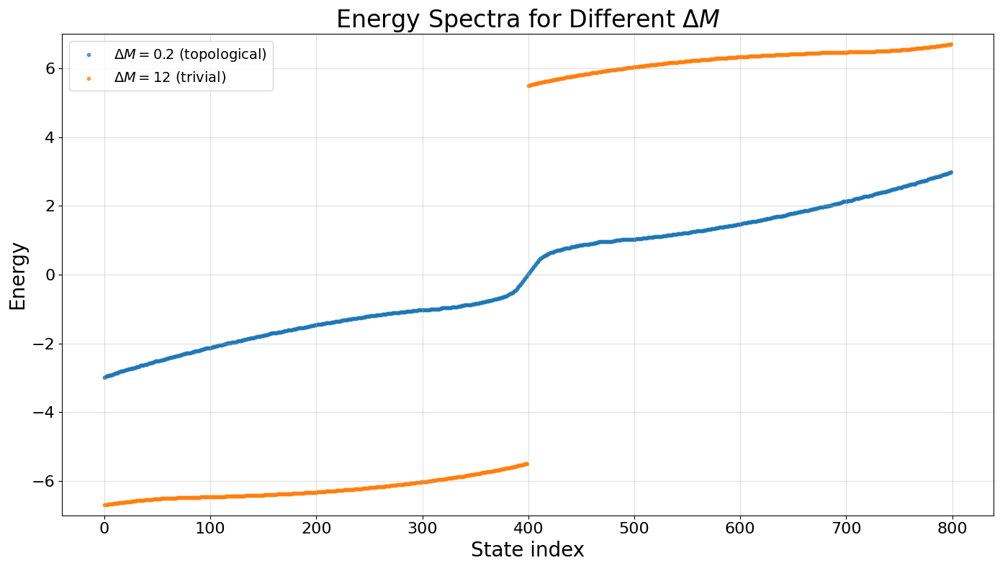

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Parameters
n = 20
m = 20
c = 1.0
cNN_mag = 0.1
phi = np.pi / 2
chunk = 5

# Mass values
M_values = [0.1, 6]

plt.figure(figsize=(14, 8))

for M in M_values:
    H = haldane_zigzag(n, m, c, cNN_mag, phi, M, M, chunk)
    eigs, _ = np.linalg.eigh(H)
    DeltaM = 2 * M

    # Explicitly set phase label
    if np.isclose(DeltaM, 0.2):
        phase = "topological"
    else:
        phase = "trivial"

    plt.scatter(np.arange(len(eigs)), eigs, s=10, alpha=0.7,
                label=fr"$\Delta M = {DeltaM}$ ({phase})")

# Formatting
plt.xlabel('State index', fontsize=20)
plt.ylabel('Energy', fontsize=20)
plt.title('Energy Spectra for Different $\Delta M$', fontsize=24)
plt.legend(fontsize=14)
plt.grid(True, alpha=0.4)
plt.ylim([-7, 7])
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.tight_layout()
plt.savefig("energy_spectra_M.png", dpi=300, bbox_inches="tight")

plt.show()


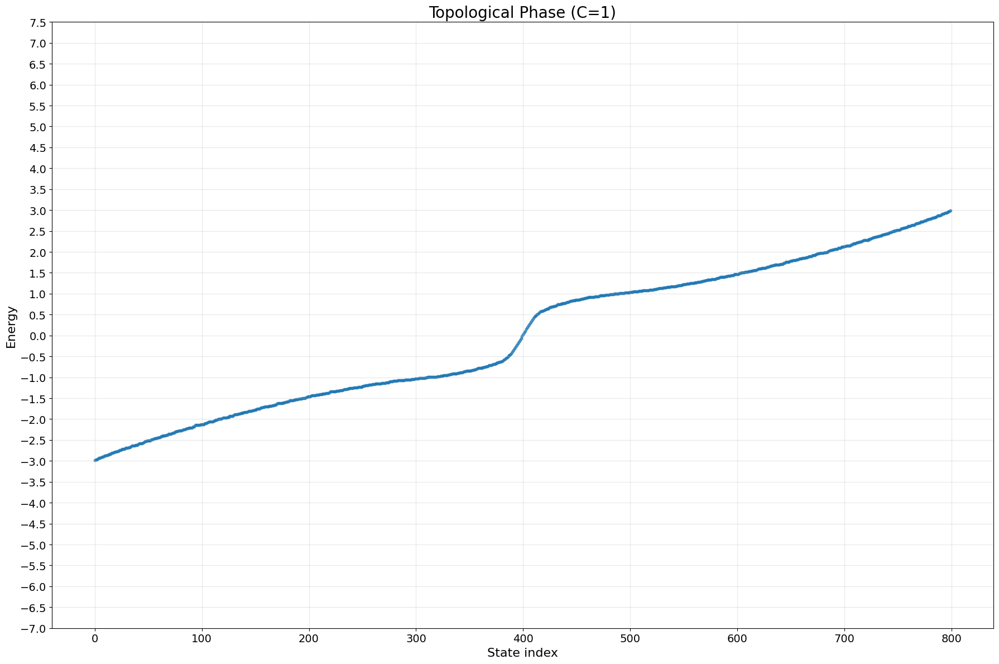

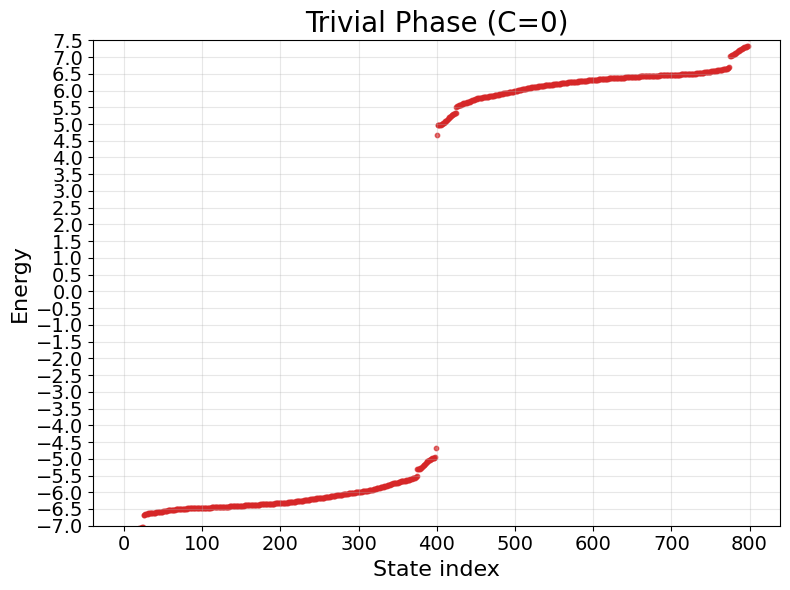

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Your functions should be defined/imported here:
# - generate_zigzag_coords
# - haldane_zigzag

# Parameters
n = 20
m = 20
c = 1.0
cNN_mag = 0.1
phi = np.pi / 2
chunk = 5
g = 0.0  # not used here

# --- Topological state (small Semenoff mass)
M_top = 0.1
H_top = haldane_zigzag(n, m, c, cNN_mag, phi, +M_top, -M_top, chunk)
eigs_top, _ = np.linalg.eigh(H_top)

# --- Trivial state (large Semenoff mass)
M_trivial = 6.0
H_trivial = haldane_zigzag(n, m, c, cNN_mag, phi, +M_trivial, -M_trivial, chunk)
eigs_trivial, _ = np.linalg.eigh(H_trivial)

# Common y-axis settings
ymin, ymax = -7, 7
yticks = np.arange(ymin, ymax + 1, 0.5)

# ======================
# Topological Phase plot
# ======================
plt.figure(figsize=(18, 12))
plt.scatter(np.arange(len(eigs_top)), eigs_top, s=10, color='tab:blue', alpha=0.7)
plt.title('Topological Phase (C=1)', fontsize=20)
plt.xlabel('State index', fontsize=16)
plt.ylabel('Energy', fontsize=16)
plt.ylim(ymin, ymax)
plt.yticks(yticks, fontsize=14)
plt.xticks(fontsize=14)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig("topological_spectrum.png", dpi=700, bbox_inches="tight")
plt.show()

# ===================
# Trivial Phase plot
# ===================
plt.figure(figsize=(8, 6))
plt.scatter(np.arange(len(eigs_trivial)), eigs_trivial, s=10, color='tab:red', alpha=0.7)
plt.title('Trivial Phase (C=0)', fontsize=20)
plt.xlabel('State index', fontsize=16)
plt.ylabel('Energy', fontsize=16)
plt.ylim(ymin, ymax)
plt.yticks(yticks, fontsize=14)
plt.xticks(fontsize=14)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig("trivial_spectrum.png", dpi=700, bbox_inches="tight")
plt.show()


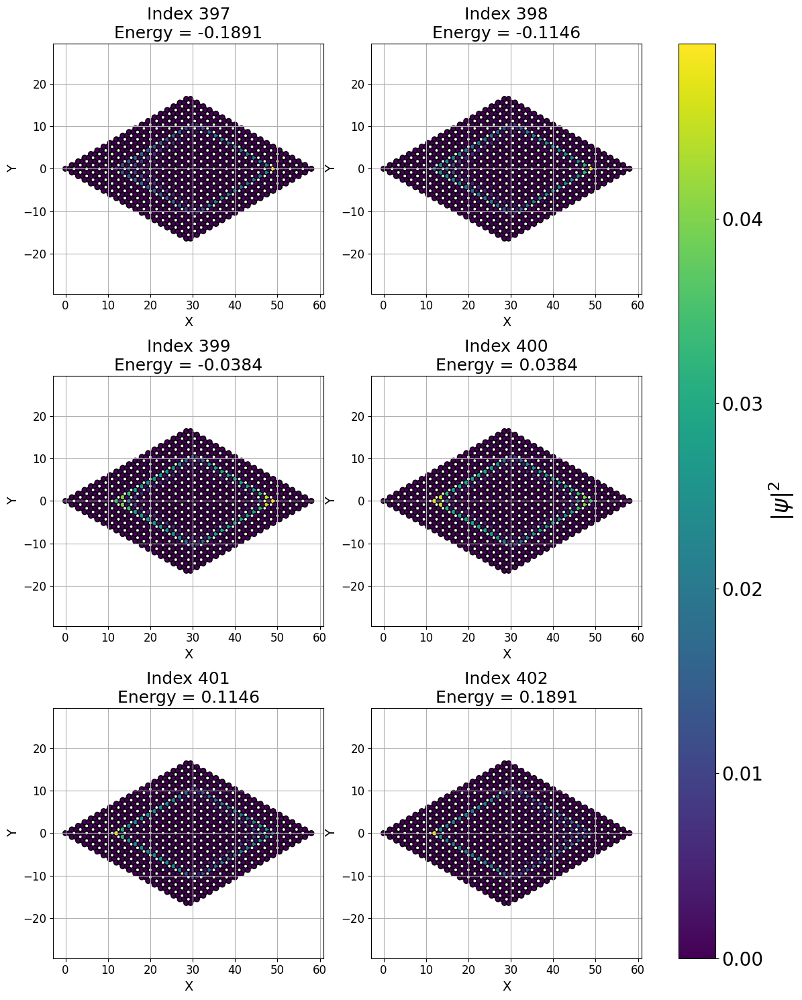

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Step 3: Generate real space coordinates
X, Y = generate_zigzag_coords(n, m)

# Define how many eigenstates to plot (must be even)
num_states_to_plot = 6
center_index = len(eigenvalues) // 2
half = num_states_to_plot // 2
indices_to_plot = list(range(center_index - half , center_index + half))

# Step 5: Plotting individual eigenstates
n_cols = 2
n_rows = int(np.ceil(len(indices_to_plot) / n_cols))

fig, axs = plt.subplots(n_rows, n_cols, figsize=(6*n_cols, 5*n_rows))

# Initialize an array to accumulate summed intensities
summed_intensity = np.zeros_like(X, dtype=float)

for i, idx in enumerate(indices_to_plot):
    row = i // n_cols
    col = i % n_cols
    ax = axs[row, col] if n_rows > 1 else axs[col]

    psi = eigenvectors[:, idx]
    intensity = np.abs(psi)**2

    # Add to summed intensity
    summed_intensity += intensity

    sc = ax.scatter(X, Y, c=intensity, cmap='viridis', s=30, edgecolors='k')
    ax.set_title(f'Index {idx}\nEnergy = {eigenvalues[idx]:.4f}', fontsize=18)
    ax.set_xlabel('X', fontsize=14)
    ax.set_ylabel('Y', fontsize=14)
    ax.tick_params(axis='both', which='major', labelsize=12)
    ax.axis('equal')
    ax.grid(True)

# Remove empty subplots if needed
for j in range(i+1, n_rows*n_cols):
    row = j // n_cols
    col = j % n_cols
    fig.delaxes(axs[row, col] if n_rows > 1 else axs[col])

plt.tight_layout()

# Add colorbar with narrower width and bigger labels
cbar = fig.colorbar(sc, ax=axs.ravel().tolist(), label=r'$|\psi|^2$', shrink=1, aspect=25)
cbar.ax.tick_params(labelsize=20)
cbar.set_label(r'$|\psi|^2$', fontsize=24)
plt.savefig("inhom_nontriv_mult_edge.png.png", dpi=300, bbox_inches="tight")  # PNG

plt.show()


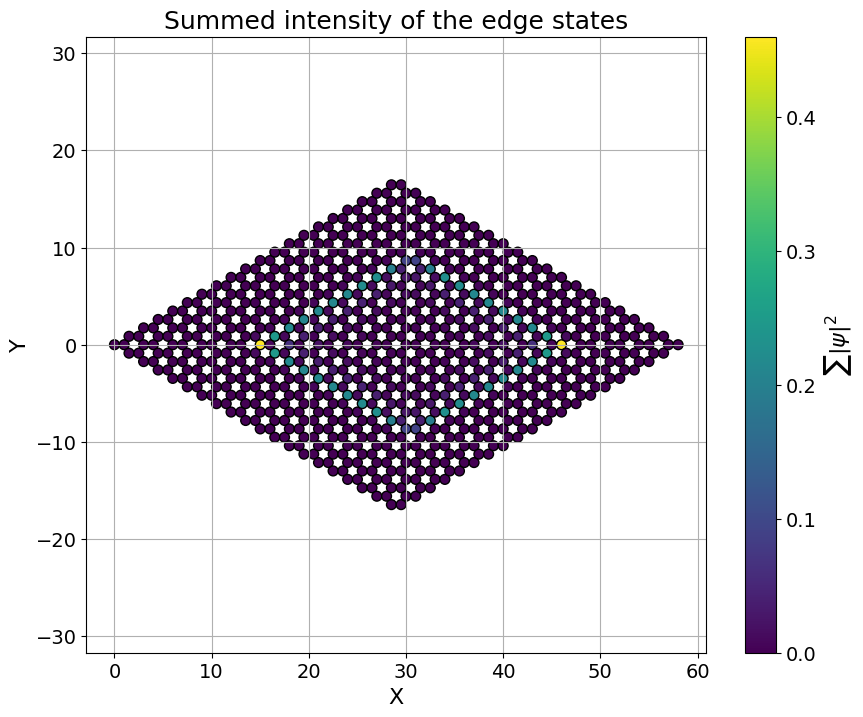

In [ ]:
# Step 6: Plot the summed intensity separately
plt.figure(figsize=(10,8))
sc = plt.scatter(X, Y, c=summed_intensity, cmap='viridis', s=50, edgecolors='k')

# Title and labels with larger font
plt.title("Summed intensity of the edge states", fontsize=18)
plt.xlabel('X', fontsize=16)
plt.ylabel('Y', fontsize=16)

# Larger ticks
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

# Axis aspect and grid
plt.axis('equal')
plt.grid(True)

# Colorbar with larger labels and tick size
cbar = plt.colorbar(sc)
cbar.set_label(r'$\sum |\psi|^2$', fontsize=16)
cbar.ax.tick_params(labelsize=14)

plt.show()


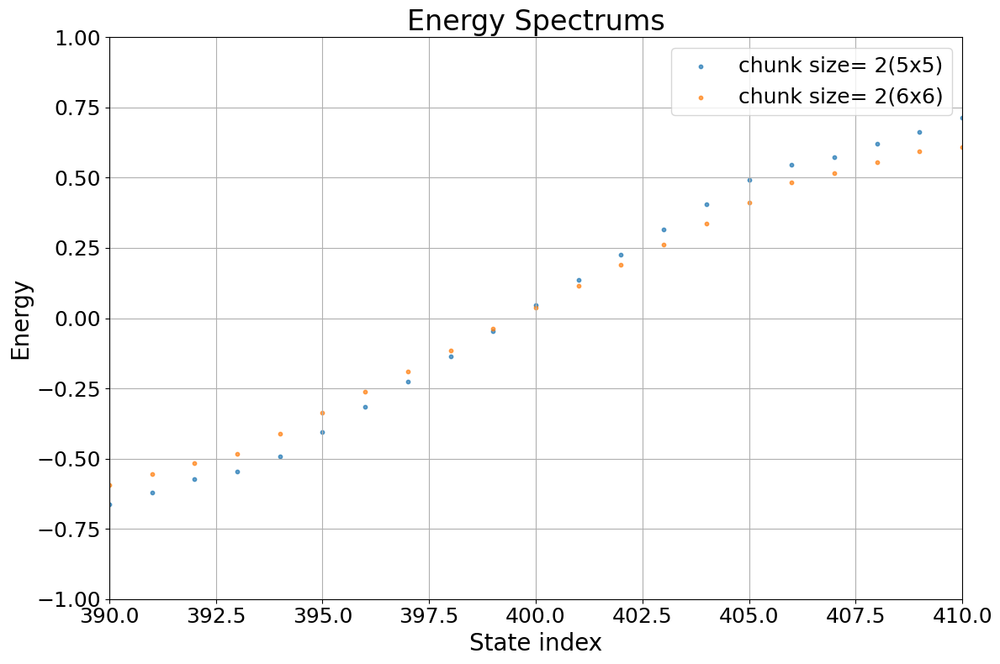

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Your functions should be defined/imported here:
# - generate_zigzag_coords
# - haldane_zigzag

# Parameters
n = 20
m = 20
c = 1.0
cNN_mag = 0.1
phi = np.pi / 2
chunk1 = 5
chunk2 = 6
g = 0.0  # not used here
M1=6
M2=0.1

# --- Topological state (small mass term)
M_top = 0.1
H_top = haldane_zigzag(n, m, c, cNN_mag, phi, M1, M2, chunk1)
eigs_top, _ = np.linalg.eigh(H_top)

# --- Trivial state (large mass term)
M_trivial = 6.0
H_trivial = haldane_zigzag(n, m, c, cNN_mag, phi, M1, M2, chunk2)
eigs_trivial, _ = np.linalg.eigh(H_trivial)

# --- Plotting
plt.figure(figsize=(12, 8))

# Topological
plt.scatter(np.arange(len(eigs_top)), eigs_top, s=10, label='chunk size= 2(5x5)', alpha=0.7)

# Trivial
plt.scatter(np.arange(len(eigs_trivial)), eigs_trivial, s=10, label='chunk size= 2(6x6)', alpha=0.7)

# Formatting with larger font sizes
plt.xlabel('State index', fontsize=20)
plt.ylabel('Energy', fontsize=20)
plt.title('Energy Spectrums', fontsize=24)
plt.legend(fontsize=18)
plt.grid(True)
plt.ylim([-1, 1])
plt.xlim([390,410])
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.savefig("theory_energy spectrum", dpi=200, bbox_inches="tight")
plt.tight_layout()
plt.show()


# my haldane

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from scipy.linalg import svd
from scipy.linalg import eigvals
from scipy.spatial import KDTree

In [ ]:
#################

# Define constants
t = 1.0   # nearest neighbor hopping parameter
t2 = 0.1 *t  # next neighbor hopping parameter
M = 0
a = 1  # lattice constant
a_next = 2 * a
Nx, Ny = 20, 10  # lattice dimensions
sigma = 1.0  # Kerr nonlinearity parameter
phi = 1/2 *np.pi
# Define nearest-neighbor vectors
delta = [np.array([a / 2, np.sqrt(3) * a / 2]),
         np.array([a / 2, -np.sqrt(3) * a / 2]),
        np.array([-a, 0])]

next_delta = [np.array([3/2 * a , np.sqrt(3) * a / 2]),
              np.array([0 , np.sqrt(3) * a]),
              np.array([0 ,-  np.sqrt(3) * a]),
              np.array([3/2 * a ,- np.sqrt(3) * a / 2]),
              np.array([- 3/2 * a ,- np.sqrt(3) * a / 2]),
              np.array([-3/2 * a , np.sqrt(3) * a / 2]),
]

a_pos_next_delta = [np.array([3/2 * a , np.sqrt(3) * a / 2]),
                  np.array([0 ,-  np.sqrt(3) * a]),
                  np.array([-3/2 * a , np.sqrt(3) * a / 2])
]

a_neg_next_delta = [np.array([3/2 * a ,- np.sqrt(3) * a / 2]),
                  np.array([0 , np.sqrt(3) * a]),
                  np.array([-3/2 * a ,- np.sqrt(3) * a / 2])
]

b_pos_next_delta = -1*a_pos_next_delta
b_neg_next_delta = -1*a_neg_next_delta


# Define lattice generation function
def generate_lattice(Nx, Ny):
    """Generate lattice sites for graphene structure."""
    A_sites, B_sites = [], []
    for i in range(Nx):
        for j in range(Ny):
            R = i * np.array([3 * a / 2, np.sqrt(3) * a / 2]) + j * np.array([3 * a / 2, -np.sqrt(3) * a / 2])
            A_sites.append(R)
            B_sites.append(R + delta[0])
    return np.array(A_sites), np.array(B_sites)

# Set up lattice and initial wavefunction
A_sites, B_sites = generate_lattice(Nx, Ny)
num_sites = len(A_sites) + len(B_sites)
A_wavefunction = np.zeros(len(A_sites), dtype=complex)


B_wavefunction = np.zeros(len(B_sites), dtype=complex)


# B_wavefunction[54] = np.sqrt(10/6)*np.exp(2j*np.pi/6) #2
# B_wavefunction[64] = np.sqrt(10/6)*np.exp(4j*np.pi/6) #4
# B_wavefunction[63] = np.sqrt(10/6)*np.exp(6j*np.pi/6) #6

# A_wavefunction[63] = np.sqrt(10/6)*np.exp(1j*np.pi/6) #1
# A_wavefunction[64] = np.sqrt(10/6)*np.exp(3j*np.pi/6) #3
# A_wavefunction[73] = np.sqrt(10/6)*np.exp(5j*np.pi/6) #5


B_wavefunction[60] = 1
B_wavefunction[70] = -1
B_wavefunction[80] = 1
B_wavefunction[90] = -1
B_wavefunction[100] = 1

wavefunction = np.concatenate((A_wavefunction, B_wavefunction))
psi = wavefunction

def hamiltonian_matrix(psi, sigma=1.0):

    phase_strength = 1/2
    phi = phase_strength * np.pi

    n_A = len(A_sites)
    n_B = len(B_sites)
    num_sites = n_A + n_B

    H = np.zeros((num_sites, num_sites), dtype=complex)

    # Build KD trees for A_sites and B_sites
    A_tree = KDTree(A_sites)
    B_tree = KDTree(B_sites)

    # Nearest-neighbor hopping between A and B sublattices
    for d in delta:
        # Query A -> B
        neighbors = B_tree.query_ball_point(A_sites + d, r=1e-8)
        for i, neighbor_indices in enumerate(neighbors):
            for k in neighbor_indices:
                H[i, n_A + k] = -t
                H[n_A + k, i] = -t

    # Next-nearest-neighbor hopping within A and B sublattices
    for d in next_delta:
        # Query A -> A
        if any(np.array_equal(d, pd) for pd in a_pos_next_delta):
          neighbors = A_tree.query_ball_point(A_sites + d, r=1e-8)
          for i, neighbor_indices in enumerate(neighbors):
            for j in neighbor_indices:
              H[i, j] = t2 * np.exp(1j * phi)
              H[j, i] = t2 * np.exp(-1j * phi)
        else:
          neighbors = A_tree.query_ball_point(A_sites + d, r=1e-8)
          for i, neighbor_indices in enumerate(neighbors):
            for j in neighbor_indices:
              H[i, j] = t2 * np.exp(-1j * phi)
              H[j, i] = t2 * np.exp(1j * phi)


        # Query B -> B
        # neighbors = B_tree.query_ball_point(B_sites + d, r=1e-8)
        # for k, neighbor_indices in enumerate(neighbors):
        #     for l in neighbor_indices:
        #         H[n_A + k, n_A + l] = t2 * np.exp(-1j * phi)
        #         H[n_A + l, n_A + k] = t2 * np.exp(1j * phi)

        if any(np.array_equal(d, pd) for pd in -1*b_pos_next_delta):
          neighbors = B_tree.query_ball_point(B_sites + d, r=1e-8)
          for k, neighbor_indices in enumerate(neighbors):
            for l in neighbor_indices:
                H[n_A + k, n_A + l] = t2 * np.exp(1j * phi)
                H[n_A + l, n_A + k] = t2 * np.exp(-1j * phi)
        else:
          neighbors = B_tree.query_ball_point(B_sites + d, r=1e-8)
          for k, neighbor_indices in enumerate(neighbors):
            for l in neighbor_indices:
                H[n_A + k, n_A + l] = t2 * np.exp(-1j * phi)
                H[n_A + l, n_A + k] = t2 * np.exp(1j * phi)

    # Vectorized assignment of M and -M to diagonal elements
    H[np.arange(n_A), np.arange(n_A)] -= M  # A-sites
    H[np.arange(n_B) + n_A, np.arange(n_B) + n_A] += M  # B-sites

    # excited_sites = [
    #     63, 64, 73,  # A sublattice indices
    #     n_A + 54, n_A + 64, n_A + 63  # B sublattice indices
    # ]

    # for i in excited_sites:
    #     n_i = np.abs(psi[i])**2  # Intensity at site i
    #     H[i, i] += 20#sigma * n_i  # Modify on-site energy with Kerr nonlinearity

    return H

H = hamiltonian_matrix(wavefunction)

NameError: name 'KDTree' is not defined

In [ ]:
# Time evolution with Runge-Kutta method
def runge_kutta_step(psi, dt , sigma = 1.0):
    k1 = -1j * H @ psi
    k2 = -1j * H @ (psi + 0.5 * dt * k1)
    k3 = -1j * H @ (psi + 0.5 * dt * k2)
    k4 = -1j * H @ (psi + dt * k3)
    return psi + (dt / 6) * (k1 + 2 * k2 + 2 * k3 + k4)

# Run simulation
timesteps = 5000
dt = 0.01
evolution = []

# Index of the site we want to monitor (B site at index 63 in B_wavefunction)
tracked_indices = [
    len(A_sites) + 54,  # B[54]
    len(A_sites) + 64,  # B[64]
    len(A_sites) + 63,  # B[63]
    63,                 # A[63]
    64,                 # A[64]
    73,                 # A[73]
]

intensity_dict = {idx: [] for idx in tracked_indices}

for _ in range(timesteps):
    wavefunction = runge_kutta_step(wavefunction, dt, sigma)

    # ✅ Normalize the wavefunction
    # wavefunction = wavefunction / (np.linalg.norm(wavefunction) + 1e-10)

    # Store intensity at target site
    for idx in tracked_indices:
        intensity_dict[idx].append(np.abs(wavefunction[idx])**2)

    # Save full probability distribution
    evolution.append(np.abs(wavefunction)**2)



# Set up figure for animation
fig, ax = plt.subplots(figsize=(10, 10))
scat_A = ax.scatter(A_sites[:, 0], A_sites[:, 1], c=[], cmap='viridis', s=100)
scat_B = ax.scatter(B_sites[:, 0], B_sites[:, 1], c=[], cmap='viridis', s=100)
plt.colorbar(scat_A, label='Probability Density')
ax.set_xlabel("x (angstroms)")
ax.set_ylabel("y (angstroms)")
ax.set_aspect('equal', adjustable='box')


plt.rcParams['animation.embed_limit'] = 500  # Sets the limit to 50 MB


# Animation update function
def update(frame):
    prob_density = evolution[frame]
    scat_A.set_array(prob_density[:len(A_sites)])
    scat_B.set_array(prob_density[len(A_sites):])
    ax.set_title(f"Time Step: {frame}")
    return scat_A, scat_B

# Create and display animation
ani = FuncAnimation(fig, update, frames=range(0, timesteps, 10), blit=True)
plt.close(fig)

# Display animation in Jupyter
from IPython.display import HTML
HTML(ani.to_jshtml())

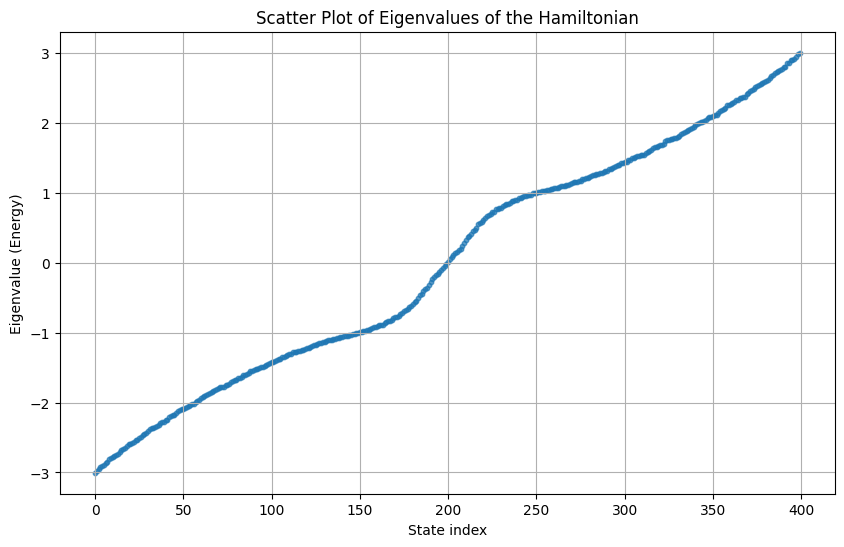

In [ ]:
# Compute eigenvalues
eigenvalues = np.linalg.eigvalsh(H)

# Sort eigenvalues (optional)
eigenvalues = np.sort(eigenvalues)

# Scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(range(len(eigenvalues)), eigenvalues, s=10, alpha=0.7)
plt.xlabel("State index")
plt.ylabel("Eigenvalue (Energy)")
plt.title("Scatter Plot of Eigenvalues of the Hamiltonian")
plt.grid(True)
plt.show()


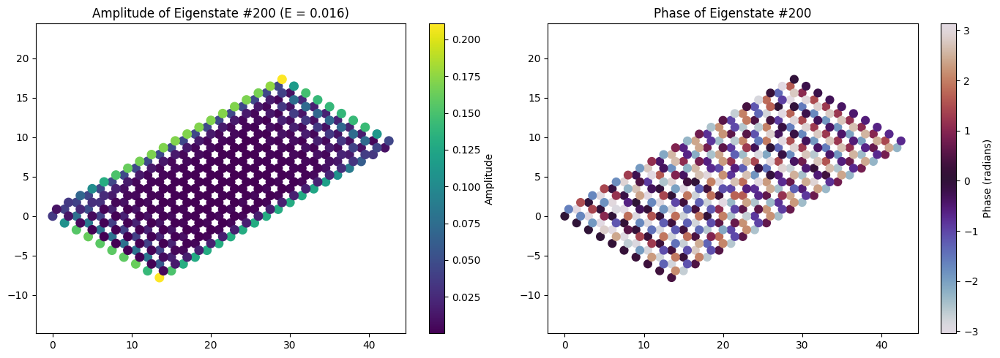

In [ ]:
# Compute both eigenvalues and eigenvectors
eigenvalues, eigenvectors = np.linalg.eigh(H)  # eigenvectors are columns


state_index =200
energy = eigenvalues[state_index]
psi_state = eigenvectors[:, state_index]  # This is a complex vector

# Amplitude and phase of the wavefunction
amplitude = np.abs(psi_state)
phase = np.angle(psi_state)



plt.figure(figsize=(14, 5))

# Plot amplitude
plt.subplot(1, 2, 1)
plt.scatter(A_sites[:, 0], A_sites[:, 1], c=amplitude[:len(A_sites)], cmap='viridis', s=70)
plt.scatter(B_sites[:, 0], B_sites[:, 1], c=amplitude[len(A_sites):], cmap='viridis', s=70)
plt.colorbar(label="Amplitude")
plt.title(f"Amplitude of Eigenstate #{state_index} (E = {energy:.3f})")
plt.axis('equal')

# Plot phase
plt.subplot(1, 2, 2)
plt.scatter(A_sites[:, 0], A_sites[:, 1], c=phase[:len(A_sites)], cmap='twilight', s=60)
plt.scatter(B_sites[:, 0], B_sites[:, 1], c=phase[len(A_sites):], cmap='twilight', s=60)
plt.colorbar(label="Phase (radians)")
plt.title(f"Phase of Eigenstate #{state_index}")
plt.axis('equal')

plt.tight_layout()
plt.show()


<ipython-input-85-f44b26459f09>:33: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])  # Leave space for colorbar


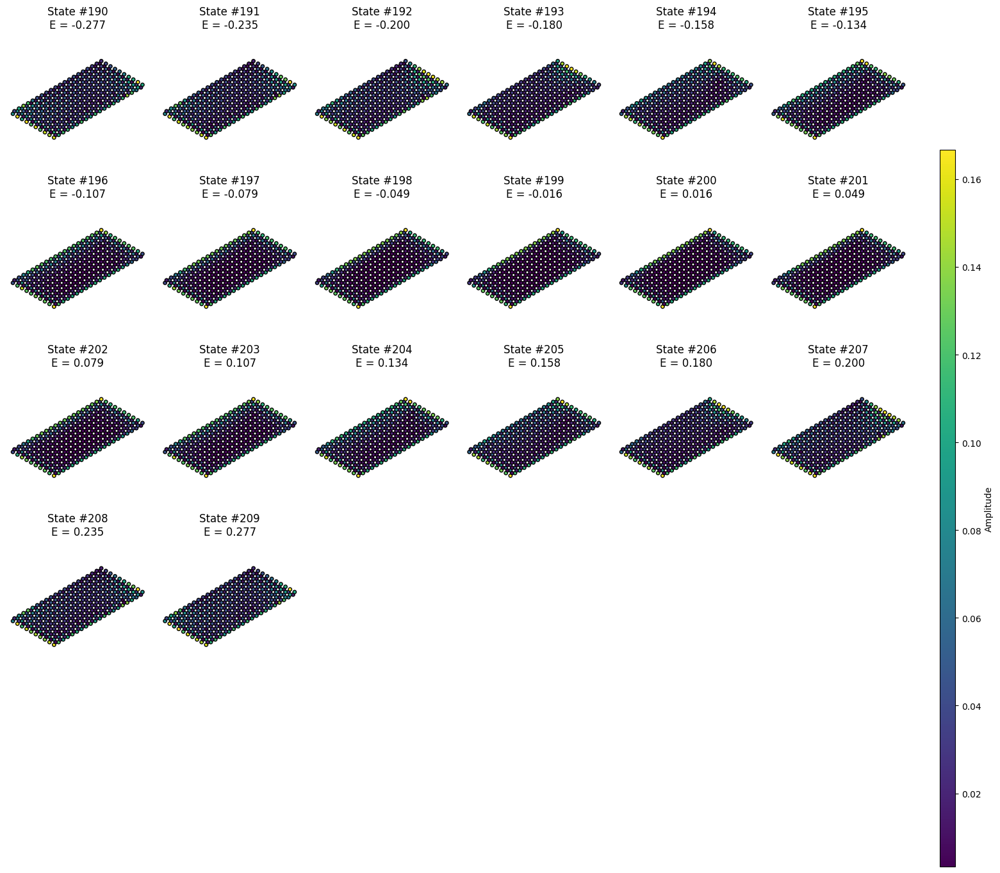

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Compute both eigenvalues and eigenvectors
eigenvalues, eigenvectors = np.linalg.eigh(H)  # eigenvectors are columns

# Plotting setup
fig, axes = plt.subplots(6, 6, figsize=(16, 16))  # 4x4 grid
axes = axes.flatten()

for i, state_index in enumerate(range(190, 210)):
    ax = axes[i]
    energy = eigenvalues[state_index]
    psi_state = eigenvectors[:, state_index]
    amplitude = np.abs(psi_state)

    # Plot amplitude on A and B sites
    sc1 = ax.scatter(A_sites[:, 0], A_sites[:, 1], c=amplitude[:len(A_sites)], cmap='viridis', s=15, edgecolors = 'k')
    sc2 = ax.scatter(B_sites[:, 0], B_sites[:, 1], c=amplitude[len(A_sites):], cmap='viridis', s=15, edgecolors= 'k')

    ax.set_title(f"State #{state_index}\nE = {energy:.3f}")
    ax.axis('equal')
    ax.axis('off')

# Remove unused subplots if any
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Add a single colorbar
cbar_ax = fig.add_axes([0.92, 0.15, 0.015, 0.7])
fig.colorbar(sc1, cax=cbar_ax, label="Amplitude")

plt.tight_layout(rect=[0, 0, 0.9, 1])  # Leave space for colorbar
plt.show()


# Chunking

In [ ]:
    # ⬇️ Hardcoded excited sites based on wavefunction initialization
excited_A_sites = [
    125, 126, 127, 128, 129, 130, 131, 132,133,134,
    145, 146, 147, 148, 149, 150, 151, 152,152,154,
    165, 166, 167, 168, 169, 170, 171, 172,173,174,
    185, 186, 187, 188, 189, 190, 191, 192,193,194,
    205, 206, 207, 208, 209, 210, 211, 212,213,214,
    225, 226, 227, 228, 229, 230, 231, 232,233,234,
    245, 246, 247, 248, 249, 250, 251, 252,253,254,
    265, 266, 267, 268, 269, 270, 271, 272,273,274,
    285, 286, 287, 288, 289, 290, 291, 292,293,294,
    305, 306, 307, 308, 309, 310, 311, 312,313,314
]



excited_B_sites = [
    105, 106, 107, 108, 109, 110, 111, 112,113,114,
    125, 126, 127, 128, 129, 130, 131, 132,133,134,
    145, 146, 147, 148, 149, 150, 151, 152,152,154,
    165, 166, 167, 168, 169, 170, 171, 172,173,174,
    185, 186, 187, 188, 189, 190, 191, 192,193,194,
    205, 206, 207, 208, 209, 210, 211, 212,213,214,
    225, 226, 227, 228, 229, 230, 231, 232,233,234,
    245, 246, 247, 248, 249, 250, 251, 252,253,254,
    265, 266, 267, 268, 269, 270, 271, 272,273,274,
    285, 286, 287, 288, 289, 290, 291, 292,293,294,
    305, 306, 307, 308, 309, 310, 311, 312,313,314
]


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from scipy.spatial import KDTree
from IPython.display import HTML

# Define constants
t = 1.0
t2 = 0.1 * t
M_out = 0
M_in = 0.

a = 1
Nx, Ny = 20 , 20
sigma = 1

# Define NN and NNN vectors
delta = [np.array([a / 2, np.sqrt(3) * a / 2]),
         np.array([a / 2, -np.sqrt(3) * a / 2]),
         np.array([-a, 0])]

next_delta = [np.array([3/2 * a , np.sqrt(3) * a / 2]),
              np.array([0 , np.sqrt(3) * a]),
              np.array([0 ,-  np.sqrt(3) * a]),
              np.array([3/2 * a ,- np.sqrt(3) * a / 2]),
              np.array([- 3/2 * a ,- np.sqrt(3) * a / 2]),
              np.array([-3/2 * a , np.sqrt(3) * a / 2])]

# Generate lattice
def generate_lattice(Nx, Ny):
    A_sites, B_sites = [], []
    for i in range(Nx):
        for j in range(Ny):
            R = i * np.array([3 * a / 2, np.sqrt(3) * a / 2]) + j * np.array([3 * a / 2, -np.sqrt(3) * a / 2])
            A_sites.append(R)
            B_sites.append(R + delta[0])
    return np.array(A_sites), np.array(B_sites)

A_sites, B_sites = generate_lattice(Nx, Ny)
num_sites = len(A_sites) + len(B_sites)
A_wavefunction = np.zeros(len(A_sites), dtype=complex)
B_wavefunction = np.zeros(len(B_sites), dtype=complex)


# # Excite selected A and B sites
# B_wavefunction[125] = 1
# B_wavefunction[145] = -1
# B_wavefunction[165] = 1
# B_wavefunction[185] = -1
# B_wavefunction[205] = 1

# B_wavefunction[40] = 1
# B_wavefunction[60] = -1
# B_wavefunction[80] = 1
# B_wavefunction[100] = -1
# B_wavefunction[120] = 1

# A_wavefunction[excited_A_sites] = 1.0 + 0j
# B_wavefunction[excited_B_sites] = 1.0 + 0j


wavefunction = np.concatenate((A_wavefunction, B_wavefunction))
psi = wavefunction

# Hamiltonian construction
def hamiltonian_matrix(psi=None):
    phase_strength = 1/2
    phi = phase_strength * np.pi
    n_A = len(A_sites)
    n_B = len(B_sites)
    num_sites = n_A + n_B
    H = np.zeros((num_sites, num_sites), dtype=complex)
    A_tree = KDTree(A_sites)
    B_tree = KDTree(B_sites)

    # Nearest-neighbor hopping (A ↔ B)
    for d in delta:
        A_shifted = A_sites + d
        neighbors = B_tree.query_ball_point(A_shifted, r=1e-8)
        row_indices = np.array(np.repeat(np.arange(n_A), [len(n) for n in neighbors]), dtype=int)
        col_indices = np.array(np.concatenate(neighbors), dtype=int) + n_A
        H[row_indices, col_indices] = -t
        H[col_indices, row_indices] = -t

    # Next-nearest-neighbor hopping (A ↔ A, B ↔ B)
    for d in next_delta:
        # Query A -> A
        if any(np.array_equal(d, pd) for pd in a_pos_next_delta):
          neighbors = A_tree.query_ball_point(A_sites + d, r=1e-8)
          for i, neighbor_indices in enumerate(neighbors):
            for j in neighbor_indices:
              H[i, j] = -t2 * np.exp(1j * phi)
              H[j, i] = -t2 * np.exp(-1j * phi)
        else:
          neighbors = A_tree.query_ball_point(A_sites + d, r=1e-8)
          for i, neighbor_indices in enumerate(neighbors):
            for j in neighbor_indices:
              H[i, j] = -t2 * np.exp(-1j * phi)
              H[j, i] = -t2 * np.exp(1j * phi)


        # Query B -> B
        # neighbors = B_tree.query_ball_point(B_sites + d, r=1e-8)
        # for k, neighbor_indices in enumerate(neighbors):
        #     for l in neighbor_indices:
        #         H[n_A + k, n_A + l] = t2 * np.exp(-1j * phi)
        #         H[n_A + l, n_A + k] = t2 * np.exp(1j * phi)

        if any(np.array_equal(d, pd) for pd in a_pos_next_delta):
          neighbors = B_tree.query_ball_point(B_sites + d, r=1e-8)
          for k, neighbor_indices in enumerate(neighbors):
            for l in neighbor_indices:
                H[n_A + k, n_A + l] = -t2 * np.exp(-1j * phi)
                H[n_A + l, n_A + k] = -t2 * np.exp(1j * phi)
        else:
          neighbors = B_tree.query_ball_point(B_sites + d, r=1e-8)
          for k, neighbor_indices in enumerate(neighbors):
            for l in neighbor_indices:
                H[n_A + k, n_A + l] = -t2 * np.exp(1j * phi)
                H[n_A + l, n_A + k] = -t2 * np.exp(-1j * phi)


    # Mass term
    H[np.arange(n_A), np.arange(n_A)] = -M_out
    H[np.arange(n_B) + n_A, np.arange(n_B) + n_A]= +M_out



    # # Apply nonlinear onsite shifts
    # H[excited_A_sites, excited_A_sites] = -M_in
    # H[np.array(excited_B_sites) + n_A, np.array(excited_B_sites) + n_A] = M_in

    # for i in excited_A_sites:
    #     H[i, i] -= sigma * np.abs(A_wavefunction[i])**2

    # for i in excited_B_sites:
    #     idx = i + n_A
    #     H[idx, idx] += sigma * np.abs(B_wavefunction[i])**2

    return H


H = hamiltonian_matrix(wavefunction)

# # Runge-Kutta time evolution
# def runge_kutta_step(psi, dt , sigma = 1.0):
#     k1 = -1j * H @ psi
#     k2 = -1j * H @ (psi + 0.5 * dt * k1)
#     k3 = -1j * H @ (psi + 0.5 * dt * k2)
#     k4 = -1j * H @ (psi + dt * k3)
#     return psi + (dt / 6) * (k1 + 2 * k2 + 2 * k3 + k4)

# # Simulation parameters
# timesteps = 5000
# dt = 0.01
# evolution = []

# # Track only initially excited sites
# tracked_indices = list(np.where(np.abs(wavefunction) > 1e-10)[0])
# intensity_dict = {idx: [] for idx in tracked_indices}
# label_map = {idx: f"A[{idx}]" if idx < len(A_sites) else f"B[{idx - len(A_sites)}]" for idx in tracked_indices}

# # Time evolution loop
# for _ in range(timesteps):
#     wavefunction = runge_kutta_step(wavefunction, dt, sigma)
#     for idx in tracked_indices:
#         intensity_dict[idx].append(np.abs(wavefunction[idx])**2)
#     evolution.append(np.abs(wavefunction)**2)

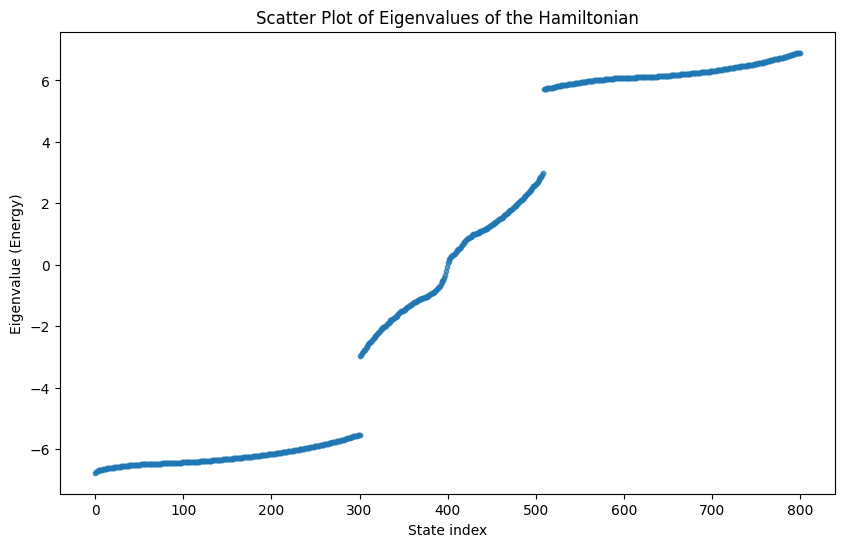

In [ ]:
# Compute both eigenvalues and eigenvectors
eigenvalues, eigenvectors = np.linalg.eigh(H)  # eigenvectors are columns

# Sort eigenvalues (optional)
eigenvalues = np.sort(eigenvalues)

# Scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(range(len(eigenvalues)), eigenvalues, s=10, alpha=0.7)
# plt.xlim([350,450])
plt.xlabel("State index")
plt.ylabel("Eigenvalue (Energy)")
plt.title("Scatter Plot of Eigenvalues of the Hamiltonian")
plt.grid(False)
plt.show()

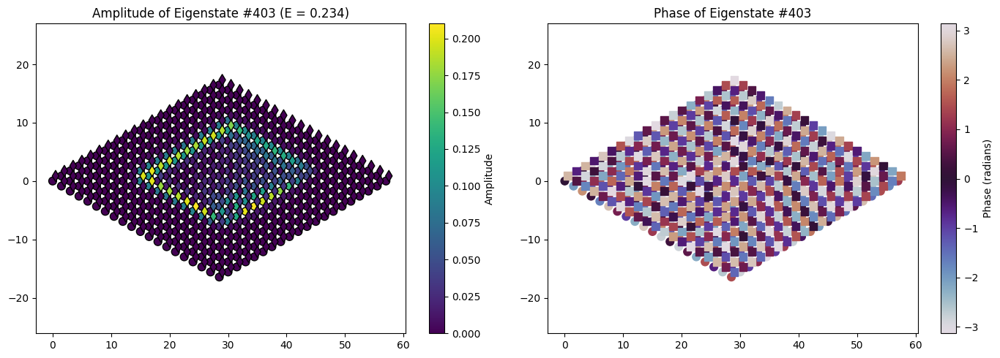

In [ ]:
state_index = 403 #400     #363      #336
energy = eigenvalues[state_index]
psi_state = eigenvectors[:, state_index]  # This is a complex vector

# Amplitude and phase of the wavefunction
amplitude = np.abs(psi_state)
phase = np.angle(psi_state)



plt.figure(figsize=(14, 5))

# Plot amplitude
plt.subplot(1, 2, 1)
plt.scatter(A_sites[:, 0], A_sites[:, 1], c=amplitude[:len(A_sites)], cmap='viridis', s=60, edgecolors = 'k')
plt.scatter(B_sites[:, 0], B_sites[:, 1], c=amplitude[len(A_sites):], cmap='viridis', s=60, marker = 'd', edgecolors= 'k')
plt.colorbar(label="Amplitude")
plt.title(f"Amplitude of Eigenstate #{state_index} (E = {energy:.3f})")
plt.axis('equal')

# Plot phase
plt.subplot(1, 2, 2)
plt.scatter(A_sites[:, 0], A_sites[:, 1], c=phase[:len(A_sites)], cmap='twilight', s=60)
plt.scatter(B_sites[:, 0], B_sites[:, 1], c=phase[len(A_sites):], cmap='twilight', s=60, marker='s')
plt.colorbar(label="Phase (radians)")
plt.title(f"Phase of Eigenstate #{state_index}")
plt.axis('equal')

plt.tight_layout()
plt.show()

<ipython-input-96-b7ac56a59f6b>:37: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])  # Leave space for colorbar


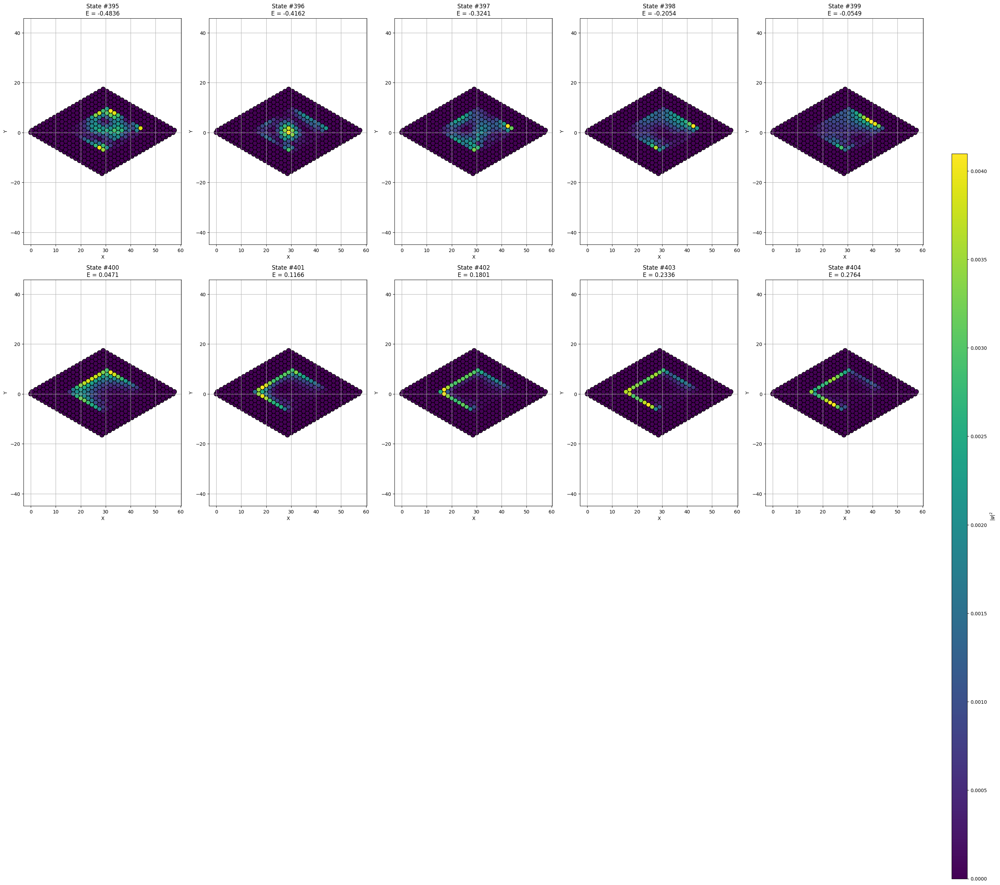

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Compute both eigenvalues and eigenvectors
eigenvalues, eigenvectors = np.linalg.eigh(H)  # eigenvectors are columns

# Plotting setup
fig, axes = plt.subplots(4, 5, figsize=(30, 30))  # 6x6 grid
axes = axes.flatten()

for i, state_index in enumerate(range(395, 405)):
    ax = axes[i]
    energy = eigenvalues[state_index]
    psi_state = eigenvectors[:, state_index]
    intensity = np.abs(psi_state)**2

    # Plot intensity on A and B sites
    sc1 = ax.scatter(A_sites[:, 0], A_sites[:, 1], c=intensity[:len(A_sites)], cmap='viridis',
                     s=90, edgecolors='k')
    sc2 = ax.scatter(B_sites[:, 0], B_sites[:, 1], c=intensity[len(A_sites):], cmap='viridis',
                     s=90, edgecolors='k')

    ax.set_title(f"State #{state_index}\nE = {energy:.4f}")
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.axis('equal')
    ax.grid(True)

# Remove unused subplots if any
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Add a single colorbar
cbar_ax = fig.add_axes([0.92, 0.15, 0.015, 0.7])
fig.colorbar(sc1, cax=cbar_ax, label=r'$|\psi|^2$')

plt.tight_layout(rect=[0, 0, 0.9, 1])  # Leave space for colorbar
plt.show()


In [ ]:
n, m = 2, 2        # lattice dimensions
c = 1.0              # NN hopping
cNN_mag = 0.1 * c    # NNN hopping magnitude
phi = np.pi / 2      # NNN hopping phase
M1 = 0               # bulk mass
M2 = 0               # perturbed region mass
chunk = 0            # perturbation chunk size

H_matlab = haldane_zigzag(n, m, c, cNN_mag, phi, M1, M2, chunk)
H_matlab

t = 1.0
t2 = 0.1 * t
M_out = 0
M_in = 0.

a = 1
Nx, Ny = 2 , 2
sigma = 1
A_sites, B_sites = generate_lattice(Nx, Ny)
num_sites = len(A_sites) + len(B_sites)

H = hamiltonian_matrix(wavefunction)

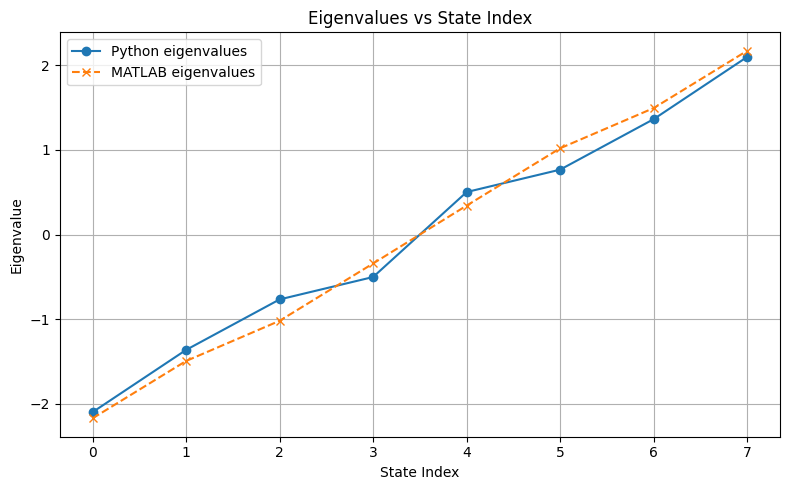

In [ ]:
eigenvalues, eigenvectors = np.linalg.eigh(H)
eigenvalues_matlab, eigenvectors_matlab = np.linalg.eigh(H_matlab)

import numpy as np
import matplotlib.pyplot as plt

# Assuming you've already computed:
# eigenvalues and eigenvalues_matlab

# Sort them for a cleaner plot (optional if already sorted)
eigenvalues = np.sort(eigenvalues)
eigenvalues_matlab = np.sort(eigenvalues_matlab)

# Create index arrays
state_indices = np.arange(len(eigenvalues))
state_indices_matlab = np.arange(len(eigenvalues_matlab))

# Plot
plt.figure(figsize=(8, 5))
plt.plot(state_indices, eigenvalues, 'o-', label='Python eigenvalues')
plt.plot(state_indices_matlab, eigenvalues_matlab, 'x--', label='MATLAB eigenvalues')
plt.xlabel('State Index')
plt.ylabel('Eigenvalue')
plt.title('Eigenvalues vs State Index')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


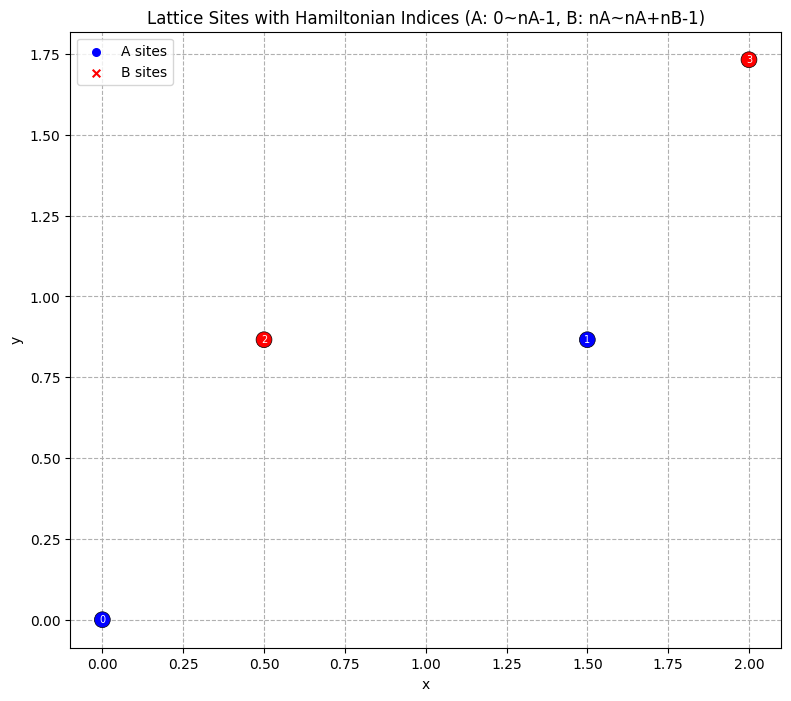

In [ ]:
plt.figure(figsize=(10, 8))

# Plot A sites
plt.scatter(A_sites[:, 0], A_sites[:, 1], color='blue', marker='o', label='A sites', s=30)
for idx, (x, y) in enumerate(A_sites):
    plt.text(x, y, str(idx), color='white', fontsize=7, ha='center', va='center',
             bbox=dict(boxstyle="circle,pad=0.3", fc="blue", ec="black", lw=0.5))

# Plot B sites
offset = len(A_sites)  # Offset for B sites
plt.scatter(B_sites[:, 0], B_sites[:, 1], color='red', marker='x', label='B sites', s=30)
for idx, (x, y) in enumerate(B_sites):
    plt.text(x, y, str(idx + offset), color='white', fontsize=7, ha='center', va='center',
             bbox=dict(boxstyle="circle,pad=0.3", fc="red", ec="black", lw=0.5))

plt.gca().set_aspect('equal')
plt.title('Lattice Sites with Hamiltonian Indices (A: 0~nA-1, B: nA~nA+nB-1)')
plt.xlabel('x')
plt.ylabel('y')
plt.grid(True, linestyle='--')
plt.legend()
plt.show()


In [ ]:
np.shape(H)

(8, 8)